# Predikcija lecenja akutnog pankreatitisa

In [41]:
#ucitavamo potrebne biblioteke
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV

# podešavanja ispisa
pd.set_option('display.float_format', lambda x: '%.2f' % x) # prikaz df na 2 decimale (npr. za describe)

In [42]:
# ucitavanje baze u pandas dataframe
df = pd.read_excel('tabela2.xlsx')

print(df.shape) # proveravamo dimenzije baze
print(df.dtypes) # i tipove podataka

(100, 92)
Broj istorije bolesti                       object
Ime                                         object
Prezime                                     object
Pol                                         object
Starost                                      int64
                                             ...  
Stentovanje holedohusa                      object
Vreme od prijema do operacije u satima.1     int64
Otpust u satima nakon operacije              int64
Dužina hospitalizacije u satima              int64
ERCP                                        object
Length: 92, dtype: object


In [43]:
df.head() # ispisujemo nekoliko (5) uzoraka

,Broj istorije bolesti,Ime,Prezime,Pol,Starost,Datum rođenja,Početak bola,Prodromi,Mučnina,Povraćanje,...,Dužina trajanja ERCP,Kanulacija,Holedoholitijaza,Papilotomija,Ekstrakcija kalkulusa,Stentovanje holedohusa,Vreme od prijema do operacije u satima.1,Otpust u satima nakon operacije,Dužina hospitalizacije u satima,ERCP
0,396 6/11c,Stanka,Rodić,Ž,60,1951,Postepen,ne,da,da,...,30.00,laka,multipla kalkuloza,da,balon,ne,370,23,393,preoperativno
1,547/11c,Lazar,Sekulić,M,61,1950,Postepen,da,da,da,...,20.00,laka,multipla kalkuloza,da,dormia,ne,48,27,85,preoperativno
2,1241/11u,Rajka,Fonjga,Ž,60,1951,Iznenadan,ne,da,da,...,40.00,laka,multipla kalkuloza,da,balon,ne,48,51,96,preoperativno
3,114 2/11c,Dragica,Stupar,Ž,60,1950,Iznenadan,ne,da,da,...,60.00,otežana,solitarni kalkulus,da,balon,ne,92,75,192,preoperativno
4,2787/11u,Sekula,Jamendžija,M,71,1940,Postepen,ne,da,ne,...,25.00,laka,multipla kalkuloza,da,dormia,da,57,84,168,preoperativno


In [44]:
# proveravamo u kom procentu ima NaN uzoraka kod obeležja koja su nam bitna
print('Svrab kože - broj NaN uzoraka:', df['Svrab kože'].isna().sum(), 'tj.', df['Svrab kože'].isna().sum()/len(df)*100, '%')
print('Veličina žučne kese - broj NaN uzoraka:', df['Veličina žučne kese'].isna().sum(), 'tj.', df['Veličina žučne kese'].isna().sum()/len(df)*100, '%')
print('Debljina zida - broj NaN uzoraka:', df['Debljina zida'].isna().sum(), 'tj.', df['Debljina zida'].isna().sum()/len(df)*100, '%')
print('Sadržaj žučne kese - broj NaN uzoraka:', df['Sadržaj žučne kese'].isna().sum(), 'tj.', df['Sadržaj žučne kese'].isna().sum()/len(df)*100, '%')
print('Tečnost u loži - broj NaN uzoraka:', df['Tečnost u loži'].isna().sum(), 'tj.', df['Tečnost u loži'].isna().sum()/len(df)*100, '%')
print('Žučni vodovi - broj NaN uzoraka:', df['Žučni vodovi'].isna().sum(), 'tj.', df['Žučni vodovi'].isna().sum()/len(df)*100, '%')
print('Pankreas - broj NaN uzoraka:', df['Pankreas'].isna().sum(), 'tj.', df['Pankreas'].isna().sum()/len(df)*100, '%')
print('Jetra - broj NaN uzoraka:', df['Jetra'].isna().sum(), 'tj.', df['Jetra'].isna().sum()/len(df)*100, '%')
print('Efuzija pleure - broj NaN uzoraka:', df['Efuzija pleure'].isna().sum(), 'tj.', df['Efuzija pleure'].isna().sum()/len(df)*100, '%')
print('Ikterus - broj NaN uzoraka:', df['Ikterus'].isna().sum(), 'tj.', df['Ikterus'].isna().sum()/len(df)*100, '%')
print('CRP - broj NaN uzoraka:', df['CRP'].isna().sum(), 'tj.', df['CRP'].isna().sum()/len(df)*100, '%')
print('Bilirubin ukupni - broj NaN uzoraka:', df['Bilirubin ukupni'].isna().sum(), 'tj.', df['Bilirubin ukupni'].isna().sum()/len(df)*100, '%')
print('Bilirubin direktni - broj NaN uzoraka:', df['Bilirubin direktni'].isna().sum(), 'tj.', df['Bilirubin direktni'].isna().sum()/len(df)*100, '%')
print('gamaGT - broj NaN uzoraka:', df['gamaGT'].isna().sum(), 'tj.', df['gamaGT'].isna().sum()/len(df)*100, '%')
print('ALT - broj NaN uzoraka:', df['ALT'].isna().sum(), 'tj.', df['ALT'].isna().sum()/len(df)*100, '%')
print('Glasgow skor - broj NaN uzoraka:', df['Glasgow skor'].isna().sum(), 'tj.', df['Glasgow skor'].isna().sum()/len(df)*100, '%')

Svrab kože - broj NaN uzoraka: 0 tj. 0.0 %
Veličina žučne kese - broj NaN uzoraka: 0 tj. 0.0 %
Debljina zida - broj NaN uzoraka: 0 tj. 0.0 %
Sadržaj žučne kese - broj NaN uzoraka: 0 tj. 0.0 %
Tečnost u loži - broj NaN uzoraka: 0 tj. 0.0 %
Žučni vodovi - broj NaN uzoraka: 0 tj. 0.0 %
Pankreas - broj NaN uzoraka: 0 tj. 0.0 %
Jetra - broj NaN uzoraka: 0 tj. 0.0 %
Efuzija pleure - broj NaN uzoraka: 0 tj. 0.0 %
Ikterus - broj NaN uzoraka: 0 tj. 0.0 %
CRP - broj NaN uzoraka: 0 tj. 0.0 %
Bilirubin ukupni - broj NaN uzoraka: 0 tj. 0.0 %
Bilirubin direktni - broj NaN uzoraka: 1 tj. 1.0 %
gamaGT - broj NaN uzoraka: 50 tj. 50.0 %
ALT - broj NaN uzoraka: 49 tj. 49.0 %
Glasgow skor - broj NaN uzoraka: 0 tj. 0.0 %


In [45]:
# buduci da je baza mala ne mozemo da je smanjujemo jos vise pa izbacujemo obelezja koja nedostaju
df.drop(['gamaGT'], inplace = True, axis=1)
df.drop(['ALT'], inplace = True, axis=1)

In [46]:
# brisemo vrednost koja nedostaje, jer je u dovoljno malom procentu
df.dropna(subset=['Bilirubin direktni'], inplace = True, axis=0)
# brisemo praznu vrednost (koja nije NaN) jer nam pravi problem
df.drop(df.loc[df['Bilirubin direktni']==' '].index,inplace = True)

In [47]:
# proveravamo tipove bitnih obeležja
print('Svrab kože: ', df['Svrab kože'].dtypes)
print('Veličina žučne kese: ', df['Veličina žučne kese'].dtypes)
print('Debljina zida: ', df['Debljina zida'].dtypes)
print('Sadržaj žučne kese: ', df['Sadržaj žučne kese'].dtypes)
print('Tečnost u loži: ', df['Tečnost u loži'].dtypes)
print('Žučni vodovi: ', df['Žučni vodovi'].dtypes)
print('Pankreas: ', df['Pankreas'].dtypes)
print('Jetra: ', df['Jetra'].dtypes)
print('Efuzija pleure: ', df['Efuzija pleure'].dtypes)
print('Ikterus: ', df['Ikterus'].dtypes)
print('CRP: ', df['CRP'].dtypes)
print('Bilirubin ukupni: ', df['Bilirubin ukupni'].dtypes)
print('Bilirubin direktni: ', df['Bilirubin direktni'].dtypes)
print('Glasgow skor: ', df['Glasgow skor'].dtypes)
print('ERCP: ', df['ERCP'].dtypes)

Svrab kože:  object
Veličina žučne kese:  object
Debljina zida:  object
Sadržaj žučne kese:  object
Tečnost u loži:  object
Žučni vodovi:  object
Pankreas:  object
Jetra:  object
Efuzija pleure:  object
Ikterus:  object
CRP:  float64
Bilirubin ukupni:  float64
Bilirubin direktni:  object
Glasgow skor:  int64
ERCP:  object


In [48]:
print('Glasgow skor: ', df['Glasgow skor'].unique())

Glasgow skor:  [2 3 1 4]


In [49]:
# izbacujemo uzorke koje imaju GLasgow skor veci od 3
#df.drop(df.loc[df['Glasgow skor']== 3 ].index,inplace = True)
df.drop(df.loc[df['Glasgow skor']== 4 ].index,inplace = True)

print(df.shape)

(94, 90)


In [50]:
# ako su object proveravamo koliko razlicitih vrenosti imamo
print('Svrab kože: ', df['Svrab kože'].unique())
print('Veličina žučne kese: ', df['Veličina žučne kese'].unique())
print('Debljina zida: ', df['Debljina zida'].unique())
print('Sadržaj žučne kese: ', df['Sadržaj žučne kese'].unique())
print('Tečnost u loži: ', df['Tečnost u loži'].unique())
print('Pankreas: ', df['Pankreas'].unique())
print('Žučni vodovi: ', df['Žučni vodovi'].unique())
print('Jetra: ', df['Jetra'].unique())
print('Efuzija pleure: ', df['Efuzija pleure'].unique())
print('Ikterus: ', df['Ikterus'].unique())
print('Bilirubin direktni: ', df['Bilirubin direktni'].unique())
print('ERCP: ', df['ERCP'].unique())

Svrab kože:  ['ne' 'da']
Veličina žučne kese:  ['distendirana' 'normalna' 'kontrahovana']
Debljina zida:  ['raslojen' 'zadebljao' 'normalan']
Sadržaj žučne kese:  ['multipla kalkuloza' 'solitarni kalkulus']
Tečnost u loži:  ['ne' 'da']
Pankreas:  ['uvećan' 'normalan' 'ne prikazuje se']
Žučni vodovi:  ['10-15mm' '3-5mm' '5-10mm' 'preko 15mm']
Jetra:  ['normalna' 'uvećana']
Efuzija pleure:  ['ne' 'da']
Ikterus:  ['ne' 'da']
Bilirubin direktni:  [70.5 14.6 52.8 2.2 25.7 4.7 105 102.5 52.6 39 3.5 22 4.4 3.3 14.3 6.5 4
 6.6 33.2 10 2 16 69.7 34.7 37.1 75.8 24.6 5.5 129 79.3 126.9 57.5 17.5
 7.1 11.1 13 8.1 3.8 37.4 62.1 47 19.3 41.5 56.7 3.2 7 78.2 79 8 1.8 92.9
 50 70 19.2 13.6 7.9 3.6 1.5 5.3 13.1 64.6 48.6 12.6 9.7 16.3 5 19.8 30.2
 44.7 78.3 65.8 92.6 33.1 80.8 68.5 15.9 22.6 5.2 2.3 28.3 86.1 47.8 13.3
 19.4 8.8 34.1]
ERCP:  ['preoperativno' 'ne' 'postoperativno']


In [51]:
# pretvaramo u numericka obelezja
df.loc[df['Svrab kože']=='ne','Svrab kože']= 0
df.loc[df['Svrab kože']=='da','Svrab kože']= 1
df['Svrab kože']=df['Svrab kože'].astype(str).astype(int)

df.loc[df['Veličina žučne kese']=='distendirana','Veličina žučne kese']= 0
df.loc[df['Veličina žučne kese']=='normalna','Veličina žučne kese']= 1
df.loc[df['Veličina žučne kese']=='kontrahovana','Veličina žučne kese']= 2
df['Veličina žučne kese']=df['Veličina žučne kese'].astype(str).astype(int)

df.loc[df['Debljina zida']=='raslojen','Debljina zida']= 0
df.loc[df['Debljina zida']=='zadebljao','Debljina zida']= 1
df.loc[df['Debljina zida']=='normalan','Debljina zida']= 2
df['Debljina zida']=df['Debljina zida'].astype(str).astype(int)

df.loc[df['Sadržaj žučne kese']=='multipla kalkuloza','Sadržaj žučne kese']= 0
df.loc[df['Sadržaj žučne kese']=='solitarni kalkulus','Sadržaj žučne kese']= 1
df['Sadržaj žučne kese']=df['Sadržaj žučne kese'].astype(str).astype(int)

df.loc[df['Tečnost u loži']=='ne','Tečnost u loži']= 0
df.loc[df['Tečnost u loži']=='da','Tečnost u loži']= 1
df['Tečnost u loži']=df['Tečnost u loži'].astype(str).astype(int)

df.loc[df['Pankreas']=='uvećan','Pankreas']= 0
df.loc[df['Pankreas']=='normalan','Pankreas']= 1
df.loc[df['Pankreas']=='ne prikazuje se','Pankreas']= 2
df['Pankreas']=df['Pankreas'].astype(str).astype(int)

df.loc[df['Žučni vodovi']=='10-15mm','Žučni vodovi']=0
df.loc[df['Žučni vodovi']=='3-5mm','Žučni vodovi']=1
df.loc[df['Žučni vodovi']=='5-10mm','Žučni vodovi']=2
df.loc[df['Žučni vodovi']=='preko 15mm','Žučni vodovi']=3
df['Žučni vodovi']=df['Žučni vodovi'].astype(str).astype(int)


df.loc[df['Jetra']=='normalna','Jetra']= 0
df.loc[df['Jetra']=='uvećana','Jetra']= 1
df['Jetra']=df['Jetra'].astype(str).astype(int)

df.loc[df['Efuzija pleure']=='ne','Efuzija pleure']= 0
df.loc[df['Efuzija pleure']=='da','Efuzija pleure']= 1
df['Efuzija pleure']=df['Efuzija pleure'].astype(str).astype(int)

df.loc[df['Ikterus']=='ne','Ikterus']= 0
df.loc[df['Ikterus']=='da','Ikterus']= 1
df['Ikterus']=df['Ikterus'].astype(str).astype(int)

df.loc[df['ERCP']=='ne','ERCP']= 0
df.loc[df['ERCP']=='preoperativno','ERCP']= 1
df.loc[df['ERCP']=='postoperativno','ERCP']= 1
# oba su 1 zato sto su oba imala ERCP
df['ERCP']=df['ERCP'].astype(str).astype(int)

df['Bilirubin direktni']=df['Bilirubin direktni'].astype(str).astype(float)

In [52]:
# proveravamo tipove bitnih obeležja
print('Svrab kože: ', df['Svrab kože'].dtypes)
print('Veličina žučne kese: ', df['Veličina žučne kese'].dtypes)
print('Debljina zida: ', df['Debljina zida'].dtypes)
print('Sadržaj žučne kese: ', df['Sadržaj žučne kese'].dtypes)
print('Tečnost u loži: ', df['Tečnost u loži'].dtypes)
print('Žučni vodovi: ', df['Žučni vodovi'].dtypes)
print('Pankreas: ', df['Pankreas'].dtypes)
print('Jetra: ', df['Jetra'].dtypes)
print('Efuzija pleure: ', df['Efuzija pleure'].dtypes)
print('Ikterus: ', df['Ikterus'].dtypes)
print('CRP: ', df['CRP'].dtypes)
print('Bilirubin ukupni: ', df['Bilirubin ukupni'].dtypes)
print('Bilirubin direktni: ', df['Bilirubin direktni'].dtypes)
print('Glasgow skor: ', df['Glasgow skor'].dtypes)
print('ERCP: ', df['ERCP'].dtypes)

Svrab kože:  int32
Veličina žučne kese:  int32
Debljina zida:  int32
Sadržaj žučne kese:  int32
Tečnost u loži:  int32
Žučni vodovi:  int32
Pankreas:  int32
Jetra:  int32
Efuzija pleure:  int32
Ikterus:  int32
CRP:  float64
Bilirubin ukupni:  float64
Bilirubin direktni:  float64
Glasgow skor:  int64
ERCP:  int32


In [53]:
# izbacujemo obelezja koja nam sigurno nisu od koristi, kao sto su imena i obeležja koja imaju jako puno nedostajucih vrednosti
# cilj projekta je da na osnovu klinicke slike odredimo da li je potrebna procedura pa znamo da ovi podaci sigurno nisu bitni

df.drop(['Broj istorije bolesti'], inplace= True, axis = 1)
df.drop(['Ime'], inplace= True, axis = 1)
df.drop(['Prezime'], inplace= True, axis = 1)
df.drop(['Datum rođenja'], inplace= True, axis = 1)
df.drop(['Vreme između operacije i  ERCP u satima'], inplace= True, axis = 1)
df.drop(['Dužina trajanja ERCP'], inplace= True, axis = 1)
df.drop(['Kanulacija'], inplace= True, axis = 1)
df.drop(['Holedoholitijaza'], inplace= True, axis = 1)
df.drop(['Papilotomija'], inplace= True, axis = 1)
df.drop(['Ekstrakcija kalkulusa'], inplace= True, axis = 1)
df.drop(['Stentovanje holedohusa'], inplace= True, axis = 1)
df.drop(['Operater'], inplace= True, axis = 1)

In [54]:
obj_df = df.select_dtypes(include=['object']).copy()
obj_df.head()

# preostali objekti u bazi

,Pol,Početak bola,Prodromi,Mučnina,Povraćanje,Taman urin,Dijareja,Opstipacija,Ranija pojava sličnih simptoma,Ranija dijagnoza holelitijaze,...,Inklavacija kalkulusa u vratu,Sadržaj žuči,Promer intrahepatičnih vodova,Promer ekstrahepatičnih vodova,Pasaža kontrasta u duodenum,Sadržaj žučnih vodova,Zatvaranje cistikusa,Konverzija,Drenaža,Sekrecija na dren
0,Ž,Postepen,ne,da,da,ne,ne,da,ne,ne,...,ne,zamućena žuč,nije rađena,nije rađena,NaN,NaN,klips,ne,da,minimalna
1,M,Postepen,da,da,da,ne,ne,ne,ne,ne,...,ne,bistra žuč,nije rađena,nije rađena,NaN,NaN,klips,ne,da,minimalna
2,Ž,Iznenadan,ne,da,da,ne,ne,ne,ne,ne,...,ne,bistra žuč,nije rađena,nije rađena,NaN,NaN,klips,ne,da,minimalna
3,Ž,Iznenadan,ne,da,da,ne,da,ne,ne,ne,...,ne,empijem,nije rađena,nije rađena,NaN,NaN,klips,ne,da,minimalna
4,M,Postepen,ne,da,ne,ne,ne,ne,da,unutar godinu,...,ne,bistra žuč,normalan,normalan,da,nema,ligatura,da,da,minimalna


In [55]:
# analiza obelezja u odnosu na pol
df_pol = df.set_index('Pol')
df_pol.head()

,Starost,Početak bola,Prodromi,Mučnina,Povraćanje,Taman urin,Dijareja,Opstipacija,Svrab kože,Ranija pojava sličnih simptoma,...,Zatvaranje cistikusa,Konverzija,Dužina operacije u minutima,Drenaža,Sekrecija na dren,Odstrnjivanje drena nakon operacije u satima,Vreme od prijema do operacije u satima.1,Otpust u satima nakon operacije,Dužina hospitalizacije u satima,ERCP
Pol,,,,,,,,,,,,,,,,,,,,,
Ž,60,Postepen,ne,da,da,ne,ne,da,0,ne,...,klips,ne,65,da,minimalna,22,370,23,393,1
M,61,Postepen,da,da,da,ne,ne,ne,0,ne,...,klips,ne,45,da,minimalna,24,48,27,85,1
Ž,60,Iznenadan,ne,da,da,ne,ne,ne,0,ne,...,klips,ne,35,da,minimalna,48,48,51,96,1
Ž,60,Iznenadan,ne,da,da,ne,da,ne,0,ne,...,klips,ne,75,da,minimalna,72,92,75,192,1
M,71,Postepen,ne,da,ne,ne,ne,ne,0,da,...,ligatura,da,60,da,minimalna,84,57,84,168,1


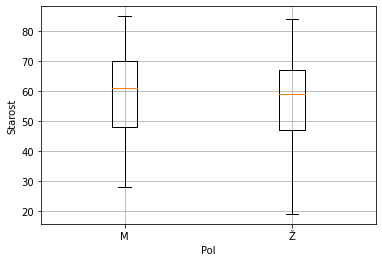

In [56]:
plt.boxplot([df_pol.loc['M', 'Starost'], df_pol.loc['Ž', 'Starost']]) 
plt.ylabel('Starost')
plt.xlabel('Pol')
plt.xticks([1, 2], ["M", "Ž"])
plt.grid()

# vrednosti su ravnomerno rasporedjene

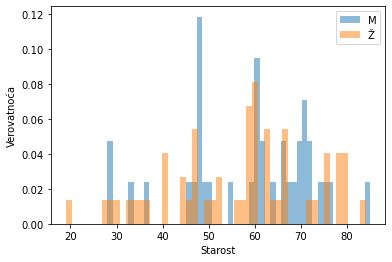

In [57]:
# histogram
plt.hist(df_pol.loc['M','Starost'], density=True, alpha=0.5, bins=50, label = 'M')
plt.hist(df_pol.loc['Ž','Starost'], density=True, alpha=0.5, bins=50, label='Ž')

plt.xlabel('Starost')
plt.ylabel('Verovatnoća')
plt.legend()

# sa histograma vidimo da su muškarci zastupljeniji, naročito oko 50 i 60 godina

In [58]:
# df = df[['a','b']]
df = df.loc[:, ['Svrab kože','Veličina žučne kese', 'Debljina zida', 'Sadržaj žučne kese','Tečnost u loži', 'Pankreas','Jetra','Efuzija pleure', 'Ikterus', 'CRP', 'Bilirubin ukupni', 'Bilirubin direktni', 'Glasgow skor', 'ERCP']]

print(df.shape)
df.head()

# radimo dalje samo sa bitnim obelezjima

(94, 14)


,Svrab kože,Veličina žučne kese,Debljina zida,Sadržaj žučne kese,Tečnost u loži,Pankreas,Jetra,Efuzija pleure,Ikterus,CRP,Bilirubin ukupni,Bilirubin direktni,Glasgow skor,ERCP
0,0,0,0,0,0,0,0,0,0,472.00,92.10,70.50,2,1
1,0,0,1,0,0,1,0,0,0,30.90,26.40,14.60,2,1
2,0,0,1,0,0,1,0,0,0,25.60,71.00,52.80,2,1
3,0,0,1,0,1,2,0,0,0,167.40,6.60,2.20,2,1
4,0,1,1,0,1,1,0,0,0,53.10,36.60,25.70,2,1


In [59]:
df.describe() # analiza obelezja

,Svrab kože,Veličina žučne kese,Debljina zida,Sadržaj žučne kese,Tečnost u loži,Pankreas,Jetra,Efuzija pleure,Ikterus,CRP,Bilirubin ukupni,Bilirubin direktni,Glasgow skor,ERCP
count,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00,94.00
mean,0.06,0.84,1.56,0.15,0.11,1.11,0.19,0.03,0.31,75.98,47.55,32.10,1.90,0.19
std,0.25,0.68,0.61,0.36,0.31,0.65,0.40,0.18,0.46,75.96,37.98,31.85,0.62,0.40
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,6.00,1.50,1.00,0.00
25%,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,30.00,14.62,6.53,2.00,0.00
50%,0.00,1.00,2.00,0.00,0.00,1.00,0.00,0.00,0.00,51.75,36.65,19.25,2.00,0.00
75%,0.00,1.00,2.00,0.00,0.00,2.00,0.00,0.00,1.00,99.03,73.97,51.95,2.00,0.00
max,1.00,2.00,2.00,1.00,1.00,2.00,1.00,1.00,1.00,472.00,160.00,129.00,3.00,1.00


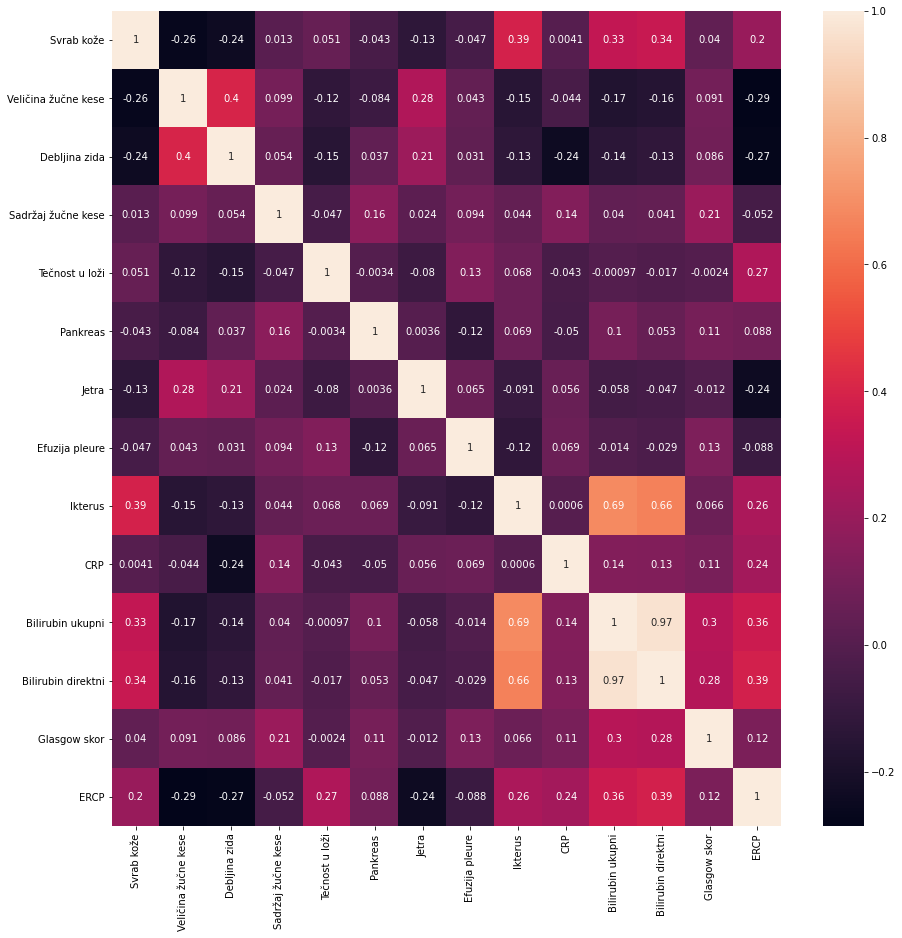

In [60]:
matrica_korelacije = df.corr()
f = plt.figure(figsize=(15, 15))

sb.heatmap(matrica_korelacije, annot=True);

In [61]:
df.drop(['Bilirubin ukupni'], inplace= True, axis = 1)

# previse velika korelacija izmedju bilirubina direktnog i ukupnog, ne saznajemo nista novo

In [62]:
df.shape

(94, 13)

In [63]:
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [64]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=42)
X = x_train
y = y_train

## SVM

In [25]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X, y)
acc = []
for c in [1, 10, 100]:
    for F in ['linear', 'rbf']:
        for mc in ['ovo', 'ovr']:
            indexes = kf.split(X, y)
            acc_tmp = []
            fin_conf_mat = np.zeros((len(np.unique(y)),len(np.unique(y))))
            for train_index, test_index in indexes:
                classifier = SVC(C=c, kernel=F, decision_function_shape=mc)
                classifier.fit(X.iloc[train_index,:], y.iloc[train_index])
                y_pred = classifier.predict(X.iloc[test_index,:])
                acc_tmp.append(accuracy_score(y.iloc[test_index], y_pred))
                fin_conf_mat += confusion_matrix(y.iloc[test_index], y_pred) #, labels=labels_y
            print('za parametre C=', c, ', kernel=', F, ' i pristup ', mc, ' tacnost je: ', np.mean(acc_tmp),
                  ' a mat. konf. je:')
            print(fin_conf_mat)
            acc.append(np.mean(acc_tmp))
print('najbolja tacnost je u iteraciji broj: ', np.argmax(acc))


za parametre C= 1 , kernel= linear  i pristup  ovo  tacnost je:  0.7555555555555555  a mat. konf. je:
[[59.  9.]
 [12.  4.]]
za parametre C= 1 , kernel= linear  i pristup  ovr  tacnost je:  0.7555555555555555  a mat. konf. je:
[[59.  9.]
 [12.  4.]]
za parametre C= 1 , kernel= rbf  i pristup  ovo  tacnost je:  0.8111111111111111  a mat. konf. je:
[[68.  0.]
 [16.  0.]]
za parametre C= 1 , kernel= rbf  i pristup  ovr  tacnost je:  0.8111111111111111  a mat. konf. je:
[[68.  0.]
 [16.  0.]]
za parametre C= 10 , kernel= linear  i pristup  ovo  tacnost je:  0.7652777777777777  a mat. konf. je:
[[57. 11.]
 [ 9.  7.]]
za parametre C= 10 , kernel= linear  i pristup  ovr  tacnost je:  0.7652777777777777  a mat. konf. je:
[[57. 11.]
 [ 9.  7.]]
za parametre C= 10 , kernel= rbf  i pristup  ovo  tacnost je:  0.775  a mat. konf. je:
[[65.  3.]
 [16.  0.]]
za parametre C= 10 , kernel= rbf  i pristup  ovr  tacnost je:  0.775  a mat. konf. je:
[[65.  3.]
 [16.  0.]]
za parametre C= 100 , kernel= line

In [26]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X, y)
fin_conf_mat = np.zeros((len(np.unique(y)),len(np.unique(y))))
for train_index, test_index in indexes:
    X_train = X.iloc[train_index,:]
    X_test = X.iloc[test_index,:]
    Y_train = y.iloc[train_index]
    Y_test = y.iloc[test_index]
    
    classifier = SVC(C=1, kernel='linear', decision_function_shape='ovr')
    classifier.fit(X_train, Y_train)
    y_pred = classifier.predict(X_test)
    conf_mat = confusion_matrix(Y_test, y_pred)
    print(conf_mat)
    print(accuracy_score(Y_test, y_pred))
    fin_conf_mat += conf_mat
    
print('finalna matrica je: ')
print(fin_conf_mat)
TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)    


[[6 1]
 [2 0]]
0.6666666666666666
[[5 2]
 [2 0]]
0.5555555555555556
[[7 0]
 [2 0]]
0.7777777777777778
[[4 3]
 [1 1]]
0.5555555555555556
[[7 0]
 [0 1]]
1.0
[[7 0]
 [1 0]]
0.875
[[6 1]
 [0 1]]
0.875
[[7 0]
 [1 0]]
0.875
[[6 0]
 [2 0]]
0.75
[[4 2]
 [1 1]]
0.625
finalna matrica je: 
[[59.  9.]
 [12.  4.]]
Tacnost klasifikatora je:  0.625
Specificnost klasifikatora je:  0.5
Preciznost klasifikatora je:  0.8
Osetljivost klasifikatora je:  0.6666666666666666


In [27]:
classifier = SVC(C=1, kernel='linear', decision_function_shape='ovr')
classifier.fit(X, y)
y_pred = classifier.predict(x_test)
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)
print('procenat pogodjenih uzoraka: ', accuracy_score(y_test, y_pred))
print('preciznost mikro: ', precision_score(y_test, y_pred, average='micro'))
print('preciznost makro: ', precision_score(y_test, y_pred, average='macro'))
print('osetljivost mikro: ', recall_score(y_test, y_pred, average='micro'))
print('osetljivost makro: ', recall_score(y_test, y_pred, average='macro'))
print('f mera mikro: ', f1_score(y_test, y_pred, average='micro'))
print('f mera makro: ', f1_score(y_test, y_pred, average='macro'))

TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)

[[8 0]
 [1 1]]
procenat pogodjenih uzoraka:  0.9
preciznost mikro:  0.9
preciznost makro:  0.9444444444444444
osetljivost mikro:  0.9
osetljivost makro:  0.75
f mera mikro:  0.9
f mera makro:  0.803921568627451
Tacnost klasifikatora je:  0.9
Specificnost klasifikatora je:  0.5
Preciznost klasifikatora je:  0.8888888888888888
Osetljivost klasifikatora je:  1.0


## Decision tree

In [65]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
parameters = {'criterion':('gini', 'entropy'), 'max_depth':[10, 15, 20], 
              'min_samples_split':[0.01, 0.05], 'class_weight':(None, 'balanced')}
dt = DecisionTreeClassifier()
clf=GridSearchCV(dt, parameters,cv=10)
clf.fit(X, y)
print(clf.best_score_)
print(clf.best_params_)

0.7958333333333333
{'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 0.01}


[[6 1]
 [1 1]]
[[6 1]
 [1 1]]
[[7 0]
 [2 0]]
[[4 3]
 [1 1]]
[[7 0]
 [0 1]]
[[7 0]
 [1 0]]
[[7 0]
 [1 0]]
[[6 1]
 [1 0]]
[[5 1]
 [2 0]]
[[5 1]
 [1 1]]
finalna matrica za stablo odluke je: 
[[60.  8.]
 [11.  5.]]
procenat pogođenih uzoraka je:  77.38095238095238 %
Tacnost klasifikatora je:  0.75
Specificnost klasifikatora je:  0.5
Preciznost klasifikatora je:  0.8333333333333334
Osetljivost klasifikatora je:  0.8333333333333334


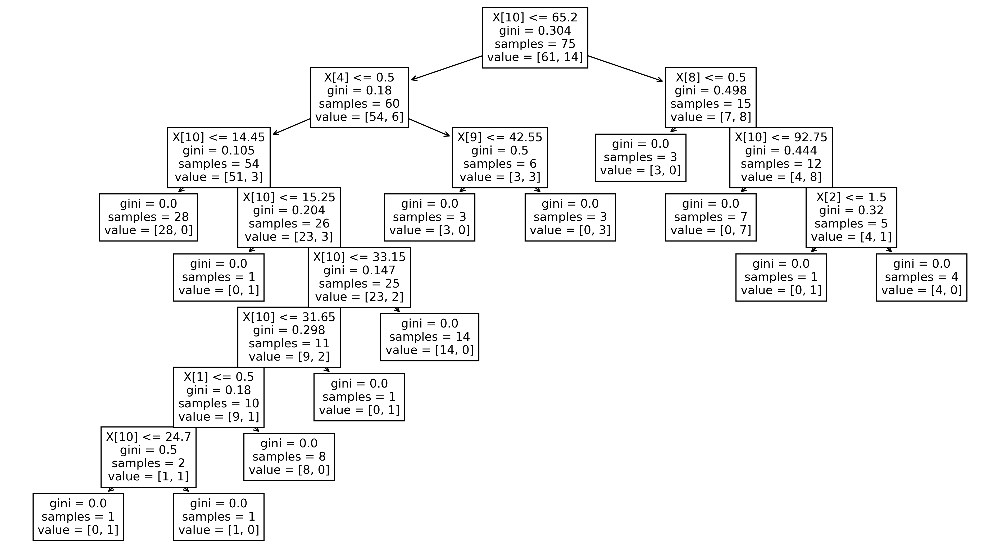

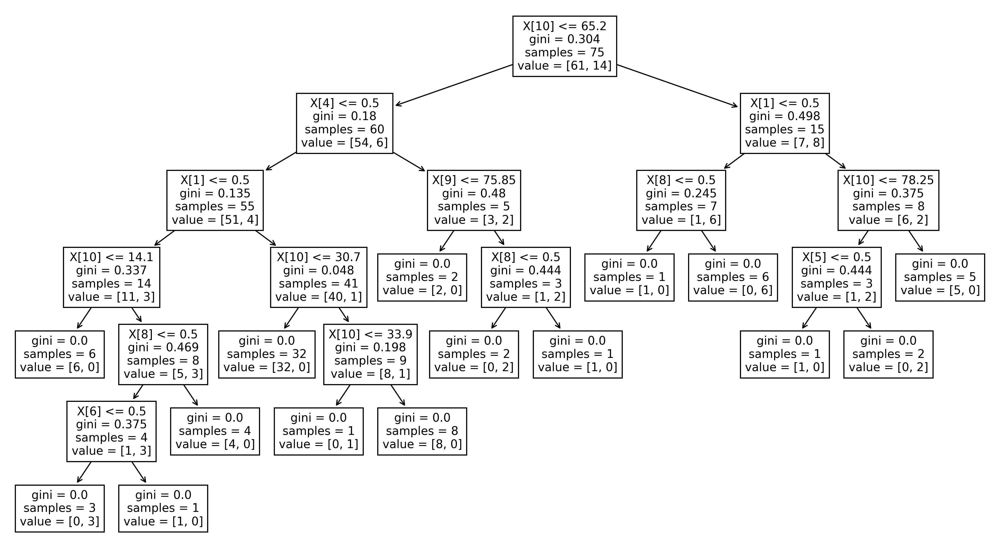

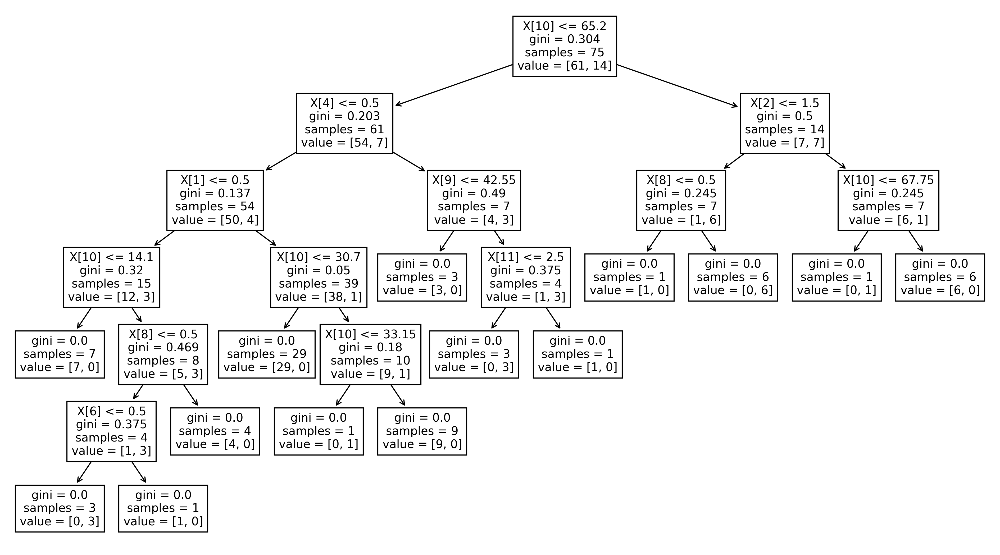

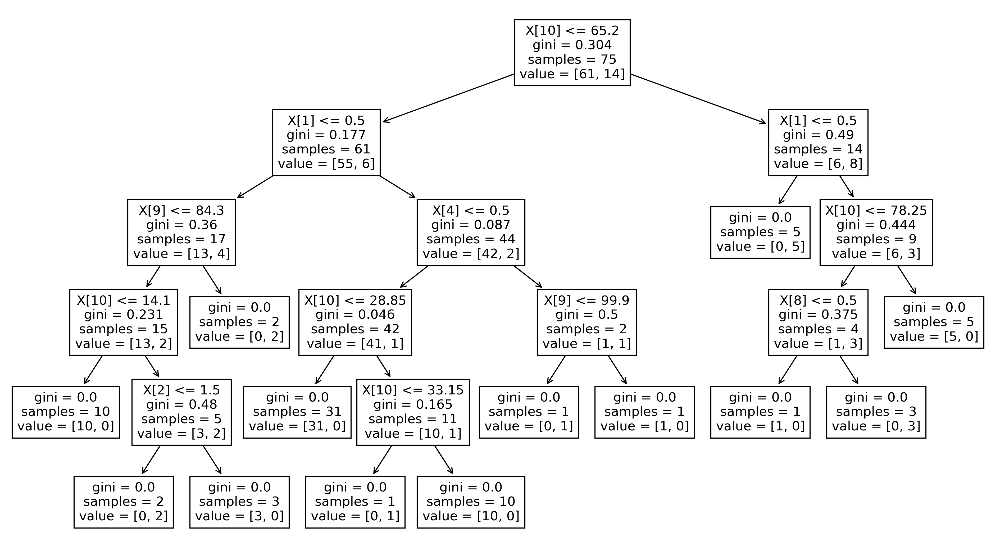

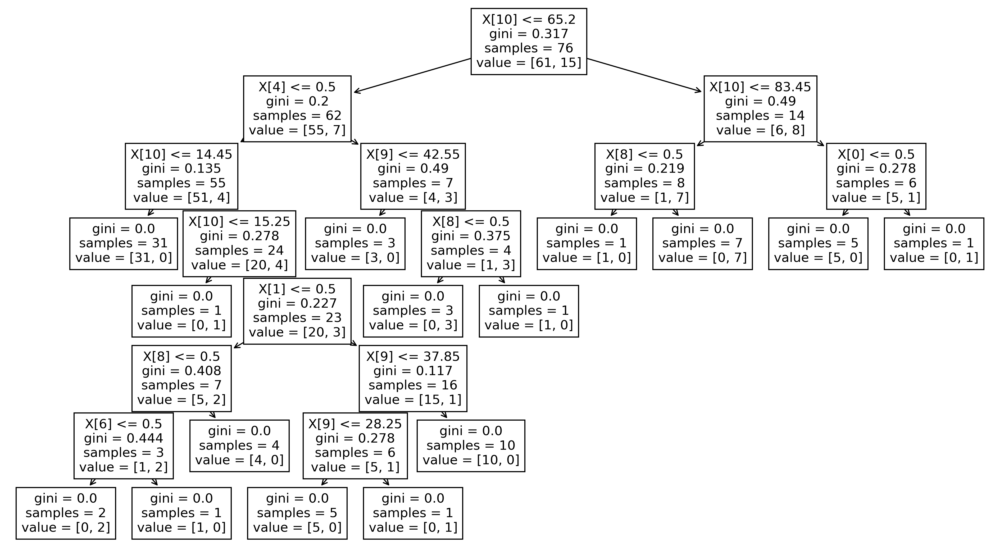

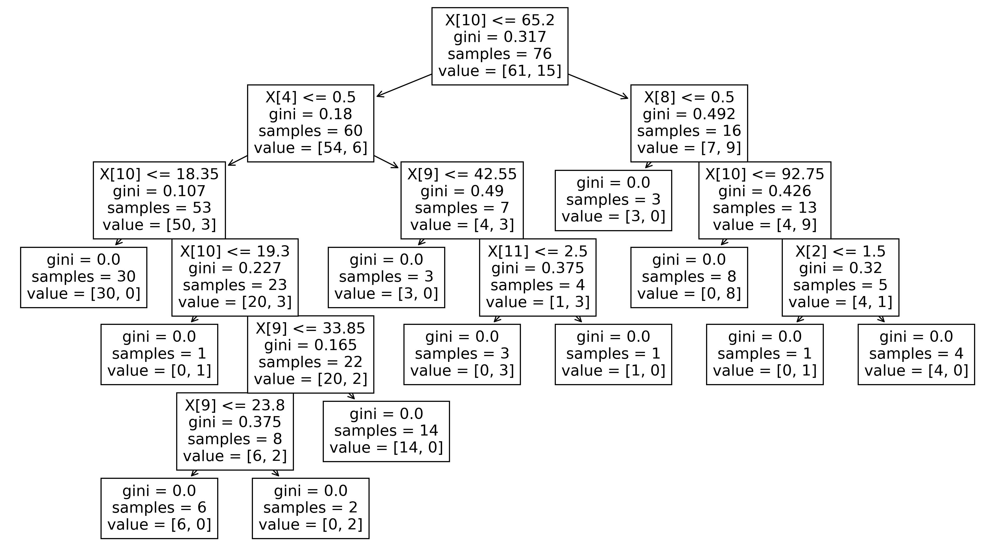

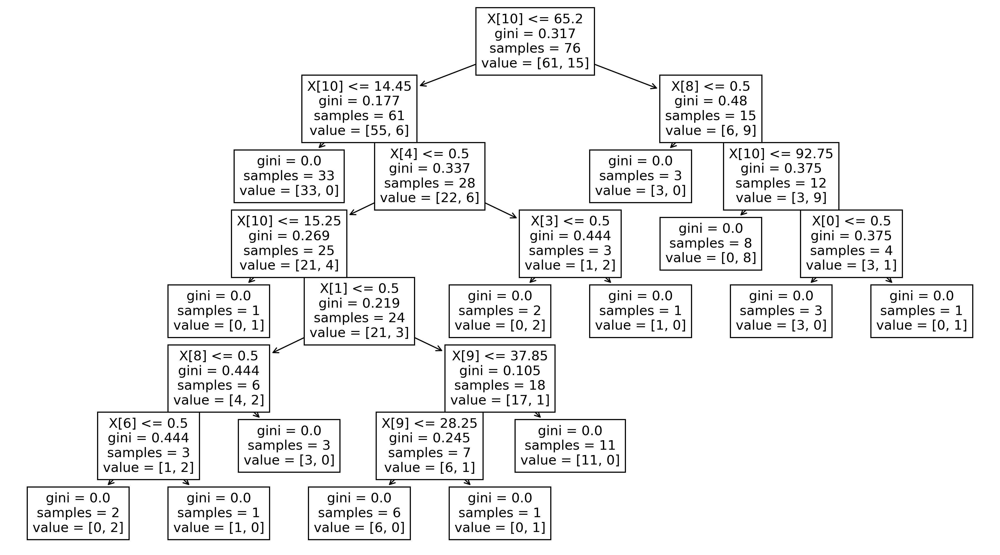

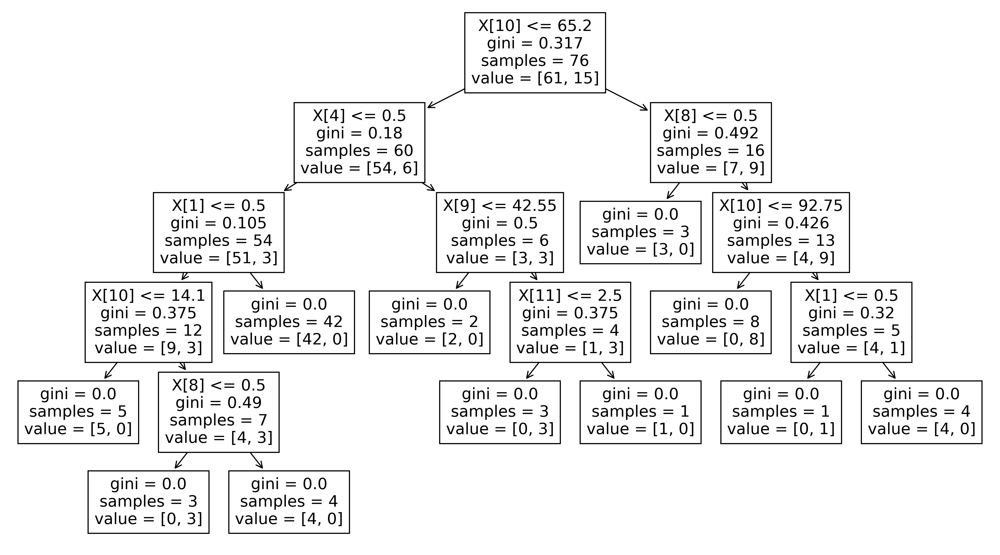

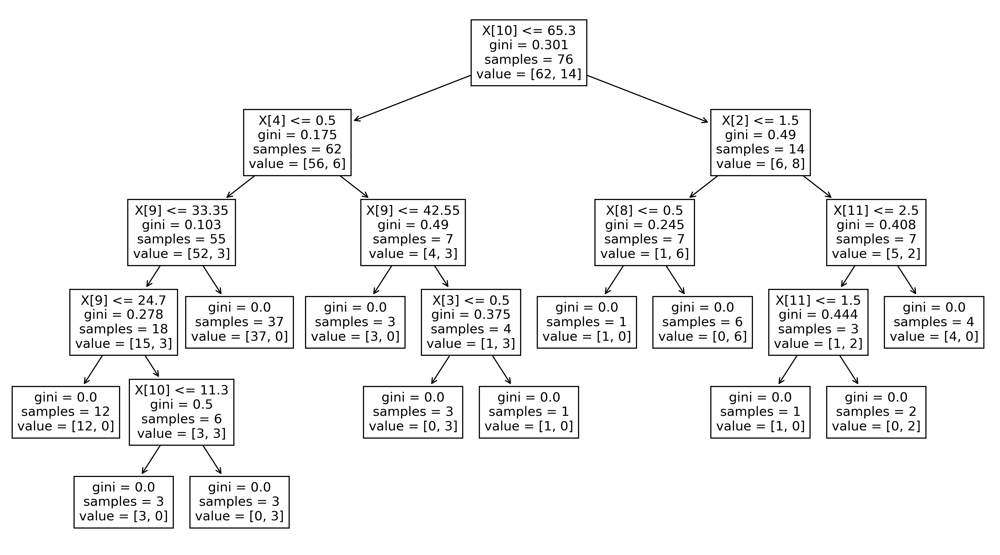

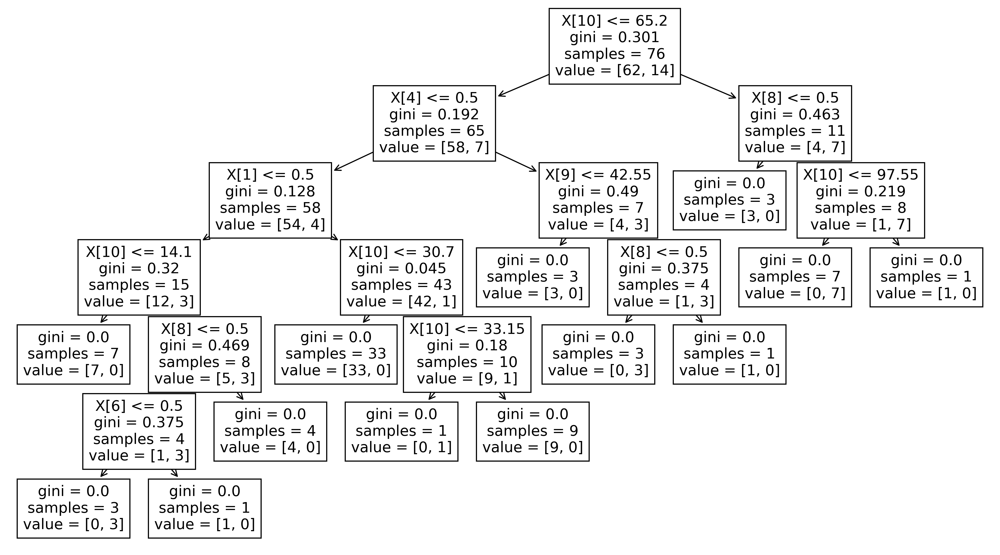

In [66]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X,y)

fin_conf_mat_dt = np.zeros((len(np.unique(y)),len(np.unique(y))))
for train_index, test_index in indexes:
    classifier = DecisionTreeClassifier(class_weight= None,criterion='gini',max_depth=10, min_samples_split=0.01)
    classifier.fit(X.iloc[train_index,:], y.iloc[train_index])
    plt.figure(figsize=(16,9), dpi=300)
    tree.plot_tree(classifier)
    Y_pred = classifier.predict(X.iloc[test_index,:])
    conf_mat = confusion_matrix(y.iloc[test_index], Y_pred)
    print(conf_mat)
    fin_conf_mat_dt += conf_mat
print('finalna matrica za stablo odluke je: ')
print(fin_conf_mat_dt)
print('procenat pogođenih uzoraka je: ', np.trace(fin_conf_mat_dt)/sum(sum(fin_conf_mat_dt))*100, '%')

TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)

In [67]:
dt = DecisionTreeClassifier(class_weight= None, criterion='gini', max_depth=10, min_samples_split=0.01)
dt.fit(X, y)
y_pred=dt.predict(x_test)
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)
print('procenat pogođenih uzoraka je: ', np.trace(conf_mat)/sum(sum(conf_mat))*100, '%')
print('procenat pogodjenih uzoraka: ', accuracy_score(y_test, y_pred))
print('preciznost mikro: ', precision_score(y_test, y_pred, average='micro'))
print('preciznost makro: ', precision_score(y_test, y_pred, average='macro'))
print('osetljivost mikro: ', recall_score(y_test, y_pred, average='micro'))
print('osetljivost makro: ', recall_score(y_test, y_pred, average='macro'))
print('f mera mikro: ', f1_score(y_test, y_pred, average='micro'))
print('f mera makro: ', f1_score(y_test, y_pred, average='macro'))
TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)

[[7 1]
 [2 0]]
procenat pogođenih uzoraka je:  70.0 %
procenat pogodjenih uzoraka:  0.7
preciznost mikro:  0.7
preciznost makro:  0.3888888888888889
osetljivost mikro:  0.7
osetljivost makro:  0.4375
f mera mikro:  0.7
f mera makro:  0.411764705882353
Tacnost klasifikatora je:  0.7
Specificnost klasifikatora je:  0.0
Preciznost klasifikatora je:  0.7777777777777778
Osetljivost klasifikatora je:  0.875


In [68]:
# izbacivanje obelezja na osnovu finalne matrice stabla odluke
df = df.loc[:, ['Svrab kože','Sadržaj žučne kese','Tečnost u loži','Efuzija pleure', 'Ikterus', 'CRP', 'ERCP']]

print(df.shape)
df.head()

(94, 7)


,Svrab kože,Sadržaj žučne kese,Tečnost u loži,Efuzija pleure,Ikterus,CRP,ERCP
0,0,0,0,0,0,472.00,1
1,0,0,0,0,0,30.90,1
2,0,0,0,0,0,25.60,1
3,0,0,1,0,0,167.40,1
4,0,0,1,0,0,53.10,1


In [69]:
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [70]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, random_state=42)
X = x_train
y = y_train

## SVM part 2

In [71]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X, y)
acc = []
for c in [1, 10, 100]:
    for F in ['linear', 'rbf']:
        for mc in ['ovo', 'ovr']:
            indexes = kf.split(X, y)
            acc_tmp = []
            fin_conf_mat = np.zeros((len(np.unique(y)),len(np.unique(y))))
            for train_index, test_index in indexes:
                classifier = SVC(C=c, kernel=F, decision_function_shape=mc)
                classifier.fit(X.iloc[train_index,:], y.iloc[train_index])
                y_pred = classifier.predict(X.iloc[test_index,:])
                acc_tmp.append(accuracy_score(y.iloc[test_index], y_pred))
                fin_conf_mat += confusion_matrix(y.iloc[test_index], y_pred) #, labels=labels_y
            print('za parametre C=', c, ', kernel=', F, ' i pristup ', mc, ' tacnost je: ', np.mean(acc_tmp),
                  ' a mat. konf. je:')
            print(fin_conf_mat)
            acc.append(np.mean(acc_tmp))
print('najbolja tacnost je u iteraciji broj: ', np.argmax(acc))


za parametre C= 1 , kernel= linear  i pristup  ovo  tacnost je:  0.7763888888888889  a mat. konf. je:
[[64.  4.]
 [15.  1.]]
za parametre C= 1 , kernel= linear  i pristup  ovr  tacnost je:  0.7763888888888889  a mat. konf. je:
[[64.  4.]
 [15.  1.]]
za parametre C= 1 , kernel= rbf  i pristup  ovo  tacnost je:  0.8111111111111111  a mat. konf. je:
[[68.  0.]
 [16.  0.]]
za parametre C= 1 , kernel= rbf  i pristup  ovr  tacnost je:  0.8111111111111111  a mat. konf. je:
[[68.  0.]
 [16.  0.]]
za parametre C= 10 , kernel= linear  i pristup  ovo  tacnost je:  0.7902777777777777  a mat. konf. je:
[[62.  6.]
 [12.  4.]]
za parametre C= 10 , kernel= linear  i pristup  ovr  tacnost je:  0.7902777777777777  a mat. konf. je:
[[62.  6.]
 [12.  4.]]
za parametre C= 10 , kernel= rbf  i pristup  ovo  tacnost je:  0.8  a mat. konf. je:
[[67.  1.]
 [16.  0.]]
za parametre C= 10 , kernel= rbf  i pristup  ovr  tacnost je:  0.8  a mat. konf. je:
[[67.  1.]
 [16.  0.]]
za parametre C= 100 , kernel= linear  

In [36]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X, y)
fin_conf_mat = np.zeros((len(np.unique(y)),len(np.unique(y))))
for train_index, test_index in indexes:
    X_train = X.iloc[train_index,:]
    X_test = X.iloc[test_index,:]
    Y_train = y.iloc[train_index]
    Y_test = y.iloc[test_index]
    
    classifier = SVC(C=1, kernel='linear', decision_function_shape='ovr')
    classifier.fit(X_train, Y_train)
    y_pred = classifier.predict(X_test)
    conf_mat = confusion_matrix(Y_test, y_pred)
    print(conf_mat)
    print(accuracy_score(Y_test, y_pred))
    fin_conf_mat += conf_mat
    
print('finalna matrica je: ')
print(fin_conf_mat)
TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)    


[[7 0]
 [2 0]]
0.7777777777777778
[[7 0]
 [2 0]]
0.7777777777777778
[[7 0]
 [2 0]]
0.7777777777777778
[[7 0]
 [2 0]]
0.7777777777777778
[[7 0]
 [1 0]]
0.875
[[7 0]
 [1 0]]
0.875
[[7 0]
 [1 0]]
0.875
[[7 0]
 [1 0]]
0.875
[[6 0]
 [2 0]]
0.75
[[6 0]
 [2 0]]
0.75
finalna matrica je: 
[[68.  0.]
 [16.  0.]]
Tacnost klasifikatora je:  0.75
Specificnost klasifikatora je:  0.0
Preciznost klasifikatora je:  0.75
Osetljivost klasifikatora je:  1.0


In [72]:
classifier = SVC(C=1, kernel='rbf', decision_function_shape='ovr')
classifier.fit(X, y)
y_pred = classifier.predict(x_test)
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)
print('procenat pogodjenih uzoraka: ', accuracy_score(y_test, y_pred))
print('preciznost mikro: ', precision_score(y_test, y_pred, average='micro'))
print('preciznost makro: ', precision_score(y_test, y_pred, average='macro'))
print('osetljivost mikro: ', recall_score(y_test, y_pred, average='micro'))
print('osetljivost makro: ', recall_score(y_test, y_pred, average='macro'))
print('f mera mikro: ', f1_score(y_test, y_pred, average='micro'))
print('f mera makro: ', f1_score(y_test, y_pred, average='macro'))

TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)

[[8 0]
 [2 0]]
procenat pogodjenih uzoraka:  0.8
preciznost mikro:  0.8
preciznost makro:  0.4
osetljivost mikro:  0.8
osetljivost makro:  0.5
f mera mikro:  0.8000000000000002
f mera makro:  0.4444444444444445
Tacnost klasifikatora je:  0.8
Specificnost klasifikatora je:  0.0
Preciznost klasifikatora je:  0.8
Osetljivost klasifikatora je:  1.0


D:\Apps\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Decision tree part 2

In [73]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
parameters = {'criterion':('gini', 'entropy'), 'max_depth':[10, 15, 20], 
              'min_samples_split':[0.01, 0.05], 'class_weight':(None, 'balanced')}
dt = DecisionTreeClassifier()
clf=GridSearchCV(dt, parameters,cv=10)
clf.fit(X, y)
print(clf.best_score_)
print(clf.best_params_)

0.7819444444444444
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 0.05}


[[4 3]
 [2 0]]
[[7 0]
 [1 1]]
[[6 1]
 [2 0]]
[[5 2]
 [0 2]]
[[5 2]
 [1 0]]
[[7 0]
 [1 0]]
[[7 0]
 [0 1]]
[[6 1]
 [1 0]]
[[6 0]
 [2 0]]
[[5 1]
 [1 1]]
finalna matrica za stablo odluke je: 
[[58. 10.]
 [11.  5.]]
procenat pogođenih uzoraka je:  75.0 %
Tacnost klasifikatora je:  0.75
Specificnost klasifikatora je:  0.5
Preciznost klasifikatora je:  0.8333333333333334
Osetljivost klasifikatora je:  0.8333333333333334


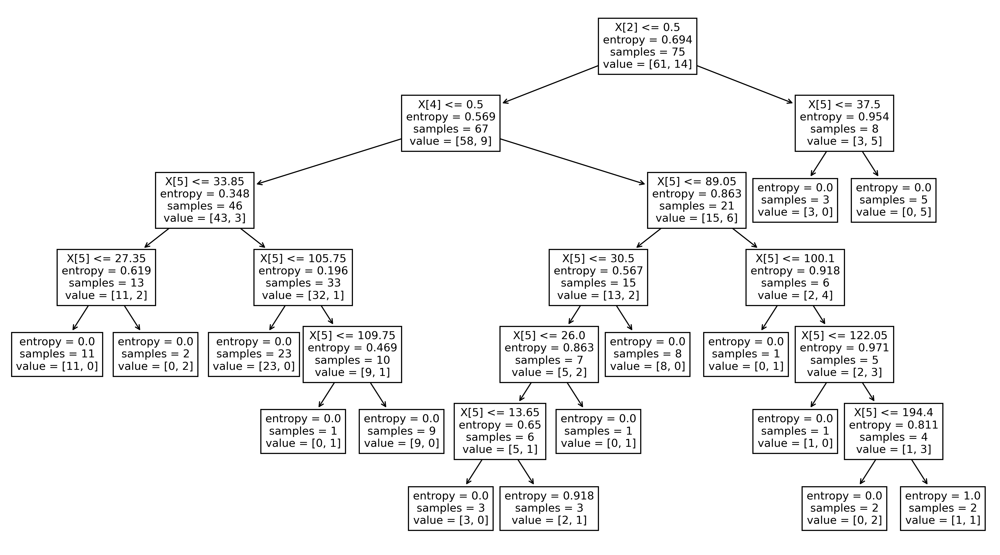

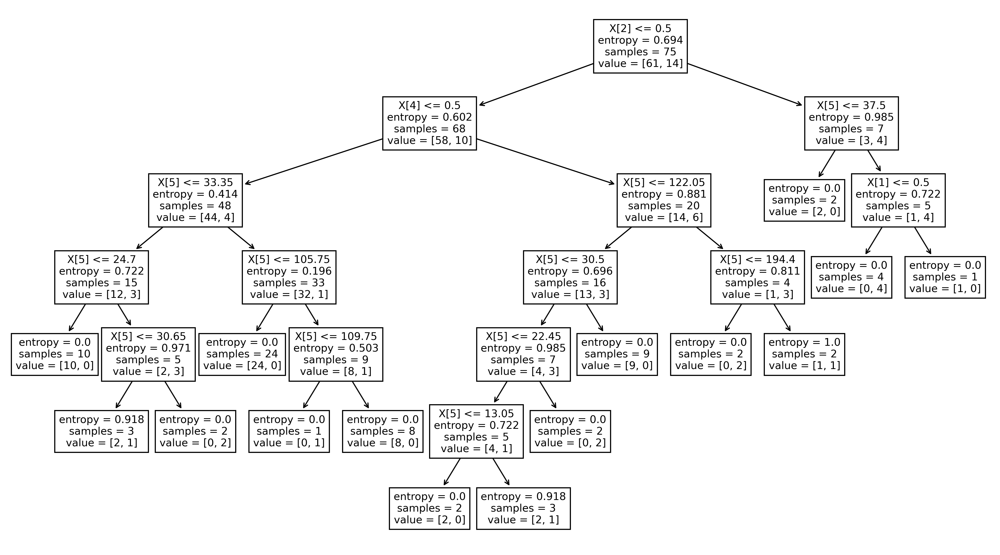

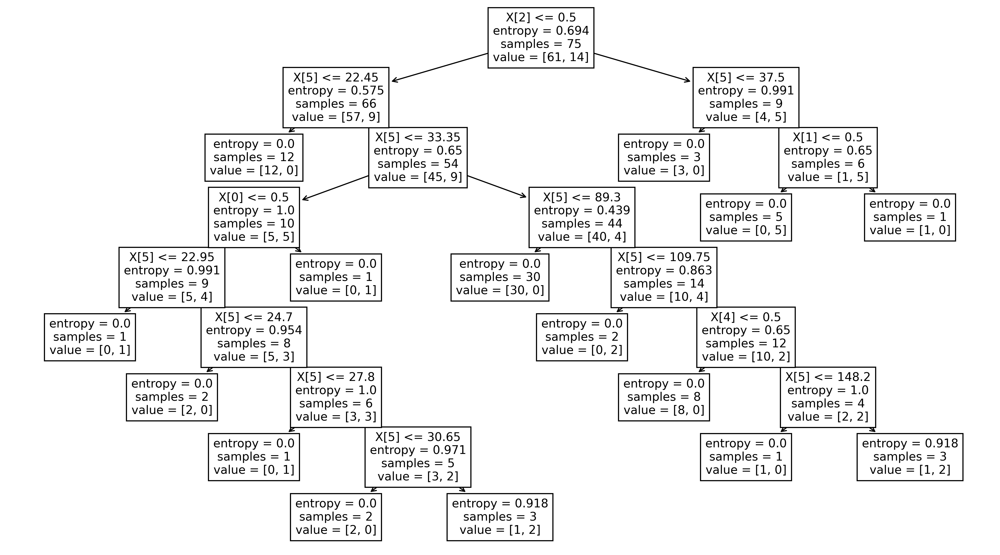

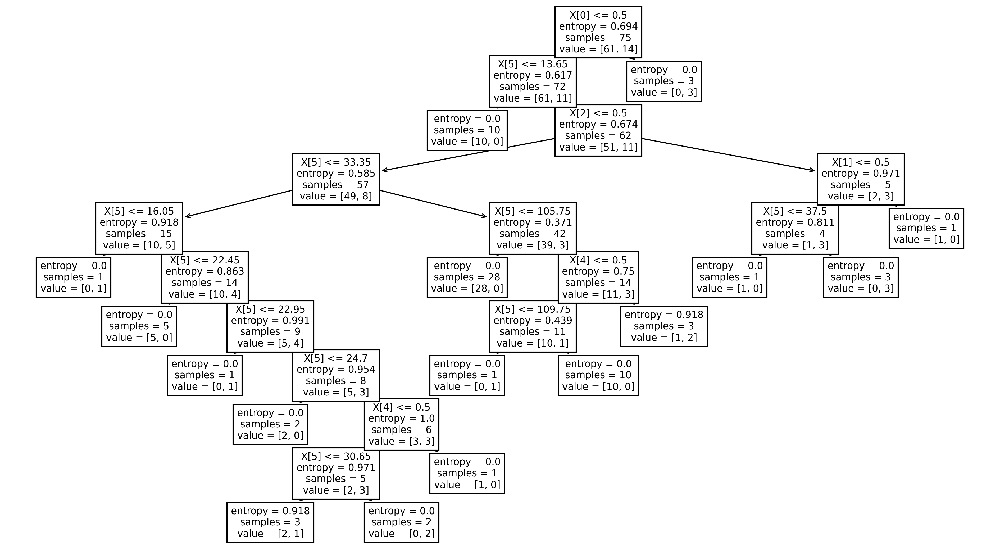

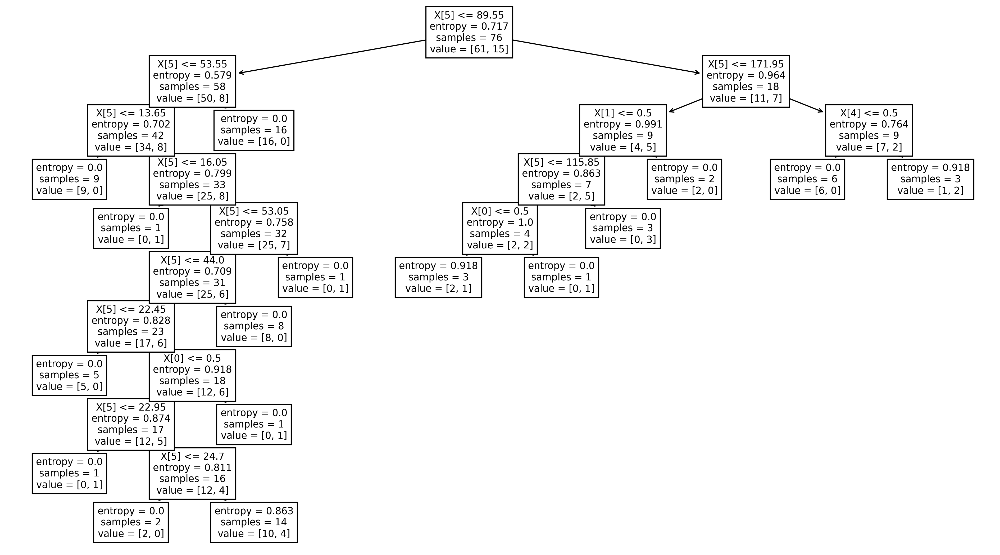

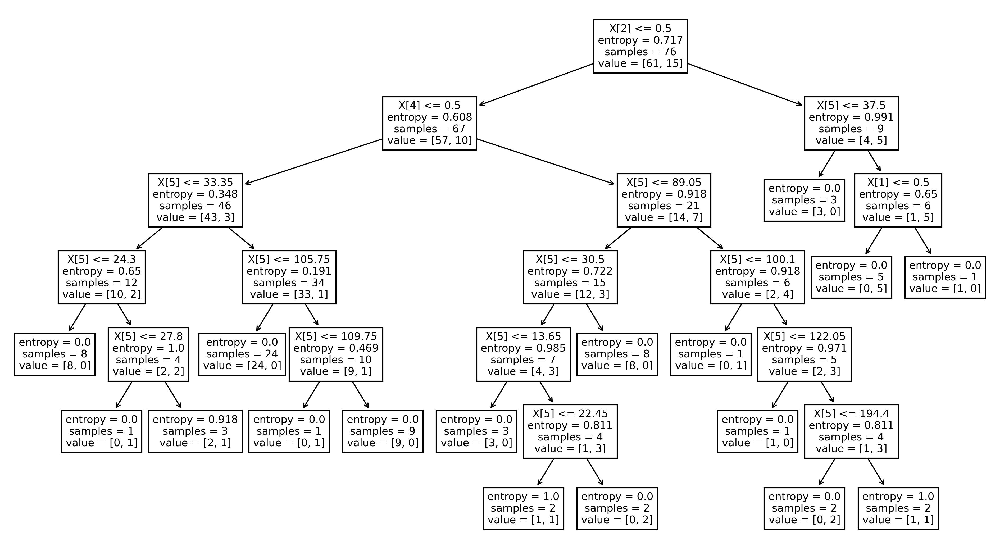

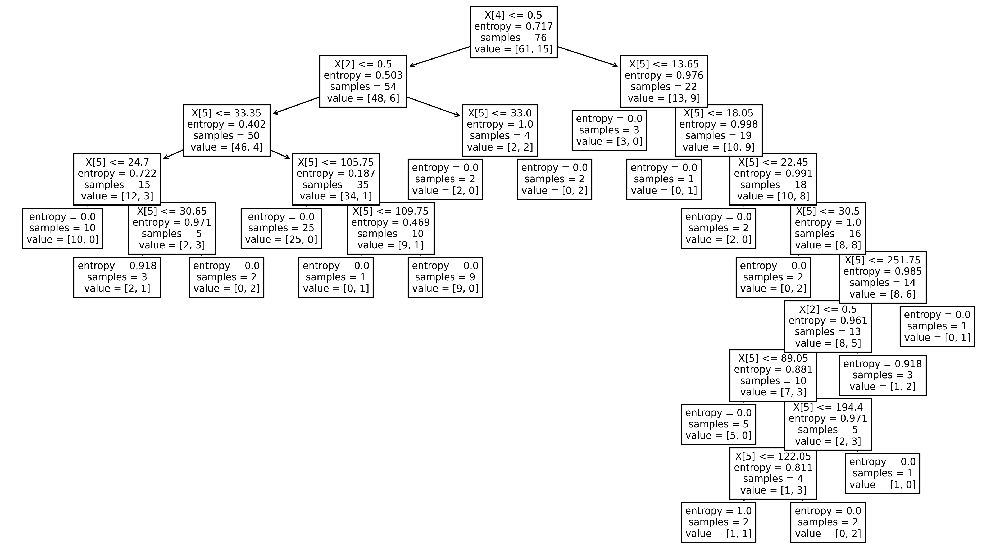

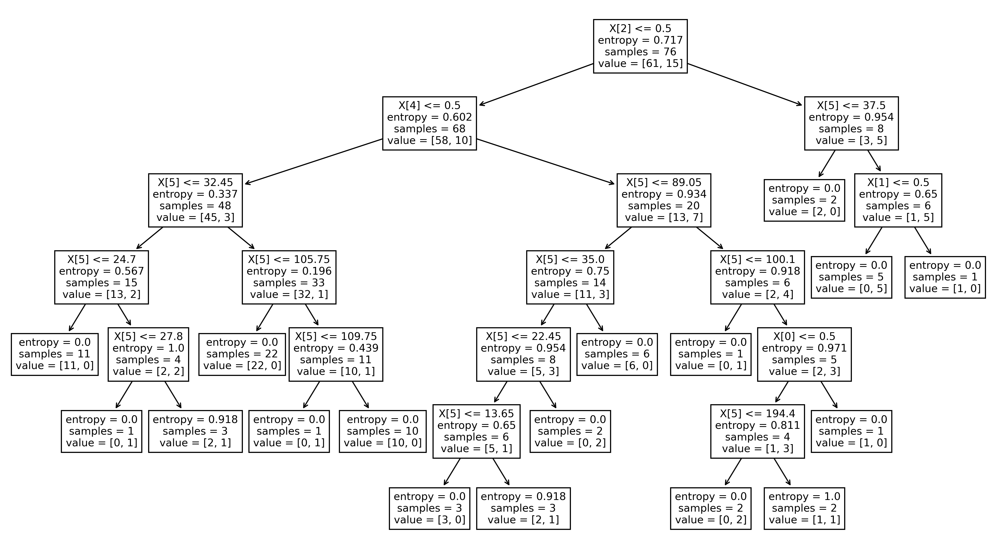

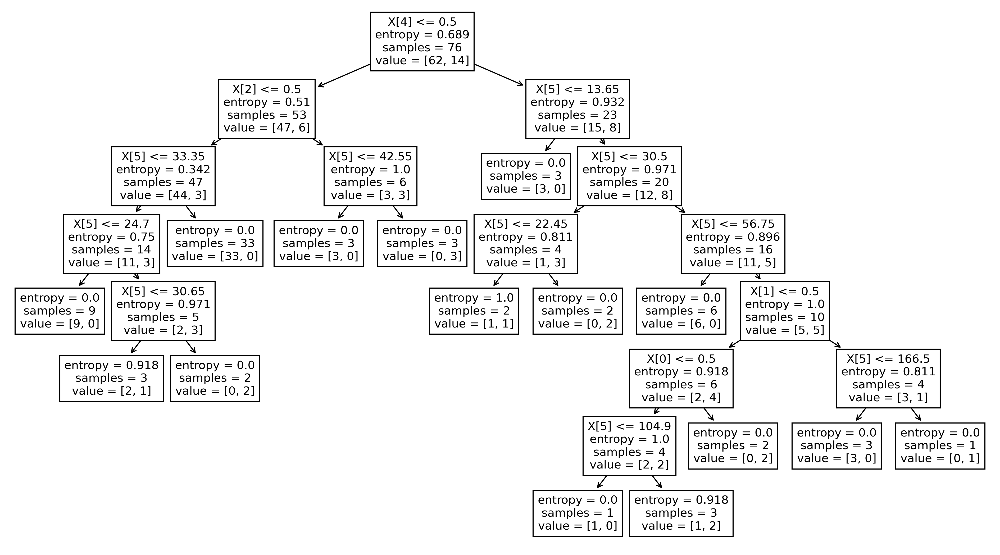

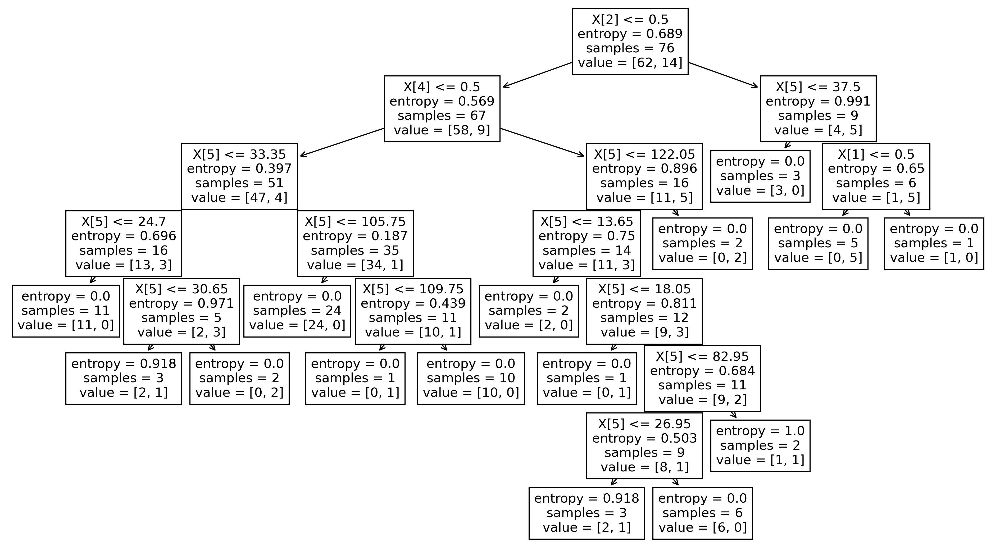

In [74]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
indexes = kf.split(X,y)

fin_conf_mat_dt = np.zeros((len(np.unique(y)),len(np.unique(y))))
for train_index, test_index in indexes:
    classifier = DecisionTreeClassifier(class_weight= None,criterion='entropy',max_depth=10, min_samples_split=0.05)
    classifier.fit(X.iloc[train_index,:], y.iloc[train_index])
    plt.figure(figsize=(16,9), dpi=300)
    tree.plot_tree(classifier)
    Y_pred = classifier.predict(X.iloc[test_index,:])
    conf_mat = confusion_matrix(y.iloc[test_index], Y_pred)
    print(conf_mat)
    fin_conf_mat_dt += conf_mat
print('finalna matrica za stablo odluke je: ')
print(fin_conf_mat_dt)
print('procenat pogođenih uzoraka je: ', np.trace(fin_conf_mat_dt)/sum(sum(fin_conf_mat_dt))*100, '%')

TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)

In [75]:
dt = DecisionTreeClassifier(class_weight= None, criterion='entropy', max_depth=10, min_samples_split=0.05)
dt.fit(X, y)
y_pred=dt.predict(x_test)
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)
print('procenat pogođenih uzoraka je: ', np.trace(conf_mat)/sum(sum(conf_mat))*100, '%')
print('procenat pogodjenih uzoraka: ', accuracy_score(y_test, y_pred))
print('preciznost mikro: ', precision_score(y_test, y_pred, average='micro'))
print('preciznost makro: ', precision_score(y_test, y_pred, average='macro'))
print('osetljivost mikro: ', recall_score(y_test, y_pred, average='micro'))
print('osetljivost makro: ', recall_score(y_test, y_pred, average='macro'))
print('f mera mikro: ', f1_score(y_test, y_pred, average='micro'))
print('f mera makro: ', f1_score(y_test, y_pred, average='macro'))
TP = conf_mat[0,0]
FP = conf_mat[1,0]
FN = conf_mat[0,1]
TN = conf_mat[1,1]
    
tacnost = (TP+TN)/(TP+TN+FP+FN)
preciznost = TP/(TP+FP)
osetljivost = TP/(TP+FN)
specificnost = TN/(TN+FP)
print('Tacnost klasifikatora je: ', tacnost)
print('Specificnost klasifikatora je: ', specificnost)    
print('Preciznost klasifikatora je: ', preciznost)
print('Osetljivost klasifikatora je: ', osetljivost)

[[7 1]
 [1 1]]
procenat pogođenih uzoraka je:  80.0 %
procenat pogodjenih uzoraka:  0.8
preciznost mikro:  0.8
preciznost makro:  0.6875
osetljivost mikro:  0.8
osetljivost makro:  0.6875
f mera mikro:  0.8000000000000002
f mera makro:  0.6875
Tacnost klasifikatora je:  0.8
Specificnost klasifikatora je:  0.5
Preciznost klasifikatora je:  0.875
Osetljivost klasifikatora je:  0.875
